In [103]:
%load_ext autoreload
%autoreload 2

# This is a test to check that collapsign scalar initial data is correct

# restart the kernel to clear past work
from IPython.core.display import HTML
HTML("<script>Jupyter.notebook.kernel.restart()</script>")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [136]:
# load the required python modules
import numpy as np
from scipy.interpolate import interp1d
from scipy.integrate import odeint
from scipy.integrate import solve_ivp
import time
import random
import sys
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib import animation
%matplotlib inline

# homemade code
sys.path.append('../source')
from initialdata.inward_gaussian import *                   # go here to change the test conditions
from matter.scalarmatter import *                       # the matter class to be used
from backgrounds.sphericalbackground import *       # go here to look at the background hat metric and scalings
from core.grid import Grid                          # go here to see how the grid and derivatives are calculated
from core.spacing import *                          # go here to import spacing
from core.display import set_grid_on_ax             # to make plots look nice
from core.statevector import *                      # helps construct the state vector with the matter
from core.rhsevolution import *                     # go here to look at how the evolution works
from bssn.tensoralgebra import *                    # some useful tensor algebra functions
from bssn.constraintsdiagnostic import *      
from bssn.ahfinder import *   
from bssn.misnersharp import *           # go here to change the  diagnostics

In [137]:
# Set up the chosen matter class
scalar_mu = 0.0
g2 = 1.0
g3 = 0.0
my_matter = ScalarMatter(scalar_mu, g2, g3)
my_state = StateVector(my_matter)

# Input parameters for grid and evolution here
r_max = 100.0 # outer edge of the grid (including ghosts)
min_dr = 0.4  # dx
# max_dr = 1.0

# SinhSpacing
# params = SinhSpacing.get_parameters(r_max, min_dr, max_dr)
# my_spacing = SinhSpacing(**params)

# CubicSpacing
params = LinearSpacing.get_parameters(r_max, min_dr)
my_spacing = LinearSpacing(**params)

# Set up the grid and the background
grid = Grid(my_spacing, my_state)
r = grid.r
num_points = r.size
my_background = FlatSphericalBackground(r)

print("Grid params are", params)

Grid params are {'r_max': 100.0, 'extent': <SpacingExtent.HALF: 0>, 'num_points': 254}


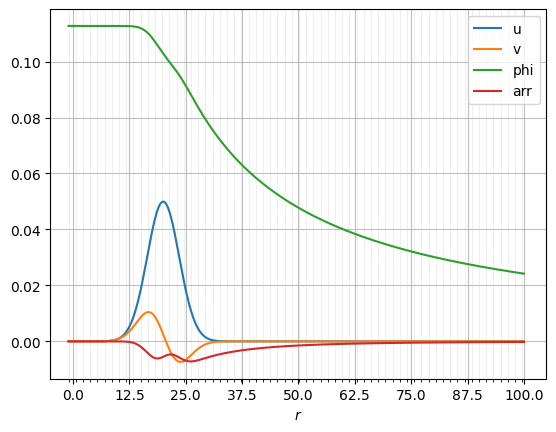

In [138]:
# Test the rhs values, use eddington finkelstein which has non trivial Kij and shift
amp = 0.05
width = 5.0
r0 = 20.0

initial_state = get_initial_state(grid, my_background, amp, r0, width)

# unpackage the vector for readability
[phi,hrr,htt,hpp,K,arr,att,app,lambdar,shiftr,br,lapse, u, v] = np.array_split(initial_state, grid.NUM_VARS)

#plot initial conditions
plt.xlabel('r')
plt.plot(r, u, label='u')
plt.plot(r, v, label='v')
#plt.plot(r, shiftr, label='shiftr')
plt.plot(r, phi, label='phi')
#plt.plot(r, hrr, label='hrr')
#plt.plot(r, htt, label='htt')
# plt.plot(r, lambdar, label='lambdar')
plt.plot(r, arr, label='arr')
#plt.plot(r, K, label='K')
# plt.plot(r, lapse, label='lapse')
# plt.ylim(0.0,0.1)
# plt.yscale('log')
plt.legend(loc='best')
ax = plt.gcf().gca()
set_grid_on_ax(ax, r)
#plt.xlim(0,50)
# print(r)
#print(r,K)
# print(phi)

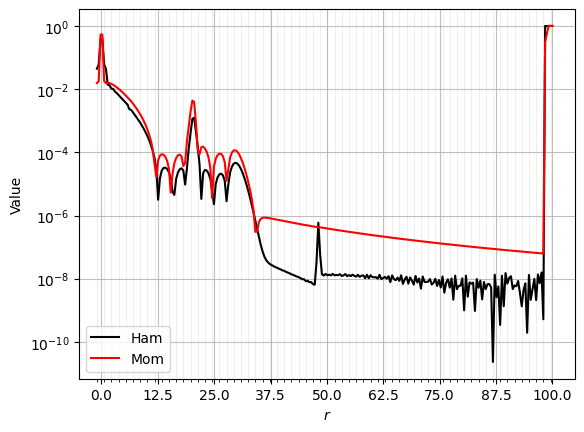

In [139]:
# check the constraints initially satisfied
Ham_out, Mom_out, Ham_abs_out, Mom_abs_out = get_constraints_diagnostic(initial_state, np.array([0]), grid, my_background, my_matter)

# plot the profile for Ham
#plt.plot(r, abs(Ham_out[0]), label = "Ham", color='k')
#plt.plot(r, abs(Ham_abs_out[0]), label = "Ham_abs", color='k', linestyle='--')
#plt.plot(r, abs(Mom_out[0,:,i_r]), label = "Mom", color='r')
#plt.plot(r, abs(Mom_abs_out[0,:,i_r]), label = "Mom_abs", color='r', linestyle='--')

plt.plot(r, abs(Ham_out[0])/Ham_abs_out[0], label = "Ham", color='k')
plt.plot(r, abs(Mom_out[0,:,i_r])/Mom_abs_out[0,:,i_r], label = "Mom", color='r')

plt.legend()
plt.xlabel('r')
plt.ylabel('Value')
ax = plt.gcf().gca()
set_grid_on_ax(ax, r)
plt.yscale('log')
# plt.xlim(,256)
# plt.ylim(-0.1,0.1)

In [140]:
# Check that for a higher resolution the Ham constraint converges (the Mom constraint is trivially zero)

# Input parameters for HR grid
min_dr_LR = 0.8 # roughly 64 points across the BH


# CubicSpacing
params_LR = LinearSpacing.get_parameters(r_max, min_dr_LR)
spacing_LR = LinearSpacing(**params_LR)

grid_LR = Grid(spacing_LR, my_state)
r_LR = grid_LR.r
num_points_LR = r_LR.size
background_LR = FlatSphericalBackground(r_LR)

# Check grid params
print(params_LR)

# Get initial state
initial_state_LR = get_initial_state(grid_LR, background_LR, amp, r0, width)


{'r_max': 100.0, 'extent': <SpacingExtent.HALF: 0>, 'num_points': 129}


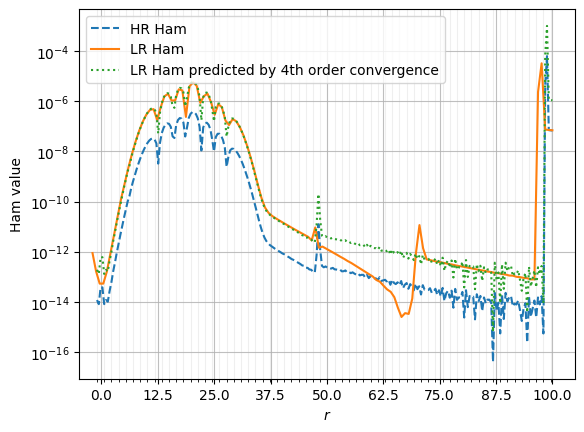

In [141]:
# check the Hamiltonian and momentum constraints are initially satisfied
Ham_LR, Mom_LR_, Ham_abs_LR, Mom_abs_LR = get_constraints_diagnostic(initial_state_LR, np.array([0]), grid_LR, background_LR, my_matter)

# plot the profiles for Ham
plt.plot(r, abs(Ham_out[0]),'--',label="HR Ham")
plt.plot(r_LR, abs(Ham_LR[0]),'-',label="LR Ham")
plt.plot(r, abs(Ham_out[0]) * 2.0**4.0,':',label="LR Ham predicted by 4th order convergence")

plt.xlabel('r')
plt.ylabel('Ham value')
ax = plt.gcf().gca()
set_grid_on_ax(ax, r)
# plt.xlim(0.0,40)
#plt.ylim(-0.0001,0.0001)
plt.yscale('log')
plt.legend()

In [142]:
# for control of time integrator and spatial grid
T = 100 # Maximum evolution time
num_points_t = 200 # time resolution (only for outputs, not for integration, which is decided by python)

# Work out dt and time spacing of outputs
dt = T/num_points_t
t = np.linspace(0, T-dt, num_points_t)

# Solve for the solution using RK45 integration of the ODE
# to make like (older) python odeint method use method='LSODA' instead
# use tqdm package to track progress
with tqdm(total=1000, unit="‰") as progress_bar:
    dense_solution = solve_ivp(get_rhs, [0,T], initial_state, 
                               args=(grid, my_background, my_matter, progress_bar, [0, T/1000]),
                        atol=1e-10, rtol=1e-12,
                        max_step = 0.4 * min_dr, #for stability and for KO coeff of 1
                        method='RK45', dense_output=True)

# Interpolate the solution at the time points requested
solution = dense_solution.sol(t).T

with tqdm(total=1000, unit="‰") as progress_bar:
    dense_solution_LR = solve_ivp(get_rhs, [0,T], initial_state_LR, 
                               args=(grid_LR, background_LR, my_matter, progress_bar, [0, T/1000]),
                        atol=1e-10, rtol=1e-12,
                        max_step = 0.4 * min_dr_LR, #for stability and for KO coeff of 1
                        method='RK45', dense_output=True)

# Interpolate the solution at the time points requested
solution_LR = dense_solution_LR.sol(t).T

  0%|          | 0/1000 [00:00<?, ?‰/s]

100%|██████████| 1000/1000 [00:20<00:00, 49.38‰/s]


In [143]:
# calculate the diagnostics, just the Hamiltonian constraint for now
Ham, Mom, Ham_abs, Mom_abs = get_constraints_diagnostic(solution, t, grid, my_background, my_matter)

# calculate the diagnostics, just the Hamiltonian constraint for now
Ham_LR, Mom_LR, Ham_abs_LR, Mom_abs_LR = get_constraints_diagnostic(solution_LR, t, grid_LR, background_LR, my_matter)

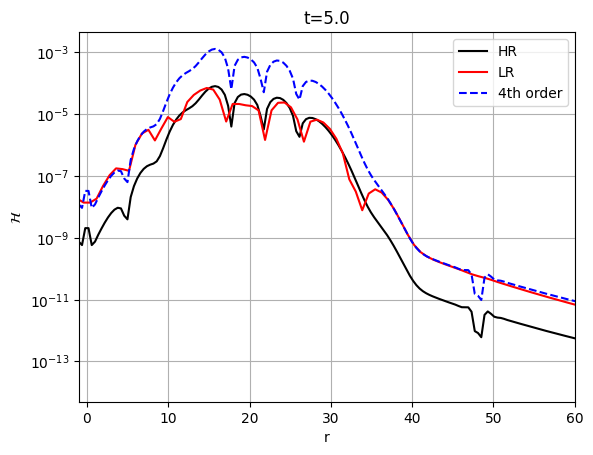

In [145]:

i = 10
plt.plot(r, abs(Ham[i,:]), 'k-', label="HR")
plt.plot(r_LR, abs(Ham_LR[i,:]), 'r-', label="LR")
plt.plot(r, abs(Ham[i,:]) * 2.0**4.0,'b--', label="4th order")
plt.legend()
plt.xlabel('r')
plt.ylabel(r'$\mathcal{H}$')
plt.yscale('log')
plt.xlim(min(r),60)
plt.title("t="+str(round(t[i],2)))
plt.grid()

3.808191365052699


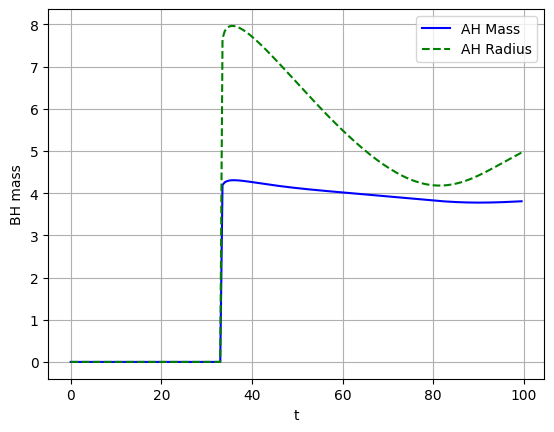

In [112]:
# Track the BH mass, show constant despite gauge evolution
omega, ah_radius, bh_mass = get_horizon_diagnostics(solution, t, grid, my_background, my_matter)



plt.plot(t, bh_mass, 'b-', label="AH Mass")
plt.plot(t, ah_radius, 'g--', label="AH Radius")
plt.legend(loc='best')
plt.xlabel('t')
plt.ylabel('BH mass')
plt.legend(loc='best')
print(bh_mass[-1])
#plt.ylim(-0.1,1.3)
plt.grid()

/var/folders/n_/m6f6pdtj2rz0xht07d4t_4nr0000gn/T/ipykernel_3243/3573618719.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')
/var/folders/n_/m6f6pdtj2rz0xht07d4t_4nr0000gn/T/ipykernel_3243/3573618719.py:8: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='best')


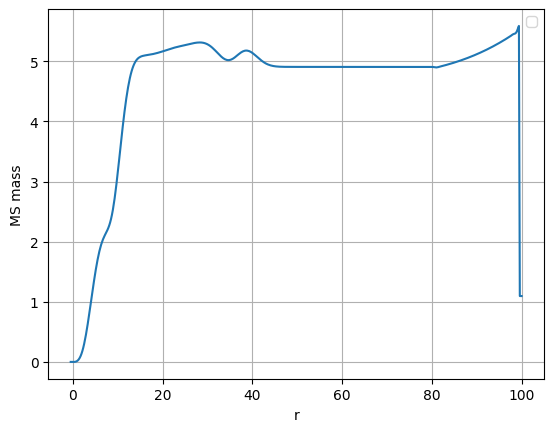

In [102]:
# Misner Sharp mass
MS_mass = get_misner_sharp(solution, t, grid, my_background, my_matter)

plt.plot(r, MS_mass[20,:])
plt.legend(loc='best')
plt.xlabel('r')
plt.ylabel('MS mass')
plt.legend(loc='best')
# print(bh_mass[-1])
#plt.ylim(-0.1,1.3)
plt.grid()


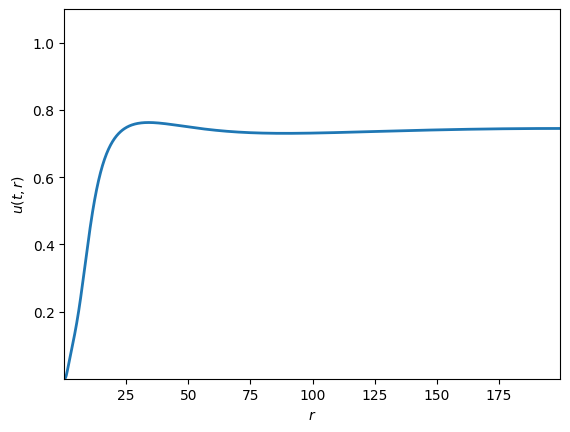

In [14]:
# Animation of the fields (u, v) varying in time
# %matplotlib notebook

# Select variable to plot (u or v)
var_to_plot_id, var_label = idx_lapse, r'$u(t,r)$'
#var_to_anim_id, var_label = my_matter.idx_uidx_v, r'$v(t,r)$'

# Pick it out of the solution vector
var_to_anim = solution[:, var_to_plot_id * num_points:var_to_plot_id * num_points + num_points]

# Set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
ax = plt.axes(xlim=(r[NUM_GHOSTS], r[-NUM_GHOSTS]), ylim=(1.1*np.min(var_to_anim), 1.1*np.max(var_to_anim)))
line, = plt.plot([], [], lw=2)
ax.set_xlabel(r'$r$')
ax.set_ylabel(var_label)

def init():
    line.set_data([], [])
    return line,

# Animation function. This is called sequentially
def animate(i):
    x = r[NUM_GHOSTS:-NUM_GHOSTS]
    y = var_to_anim[i][NUM_GHOSTS:-NUM_GHOSTS]
    line.set_data(x, y)
    return line,

# Call the animator
anim = animation.FuncAnimation(fig, animate, init_func=init, frames=np.arange(0,num_points_t,1), interval=100, blit=True)

# Display the animation interactively.
from IPython.display import HTML
HTML(anim.to_jshtml())

# Option to save the animation - requires a codec e.g. FFMPEG
#anim.save('./field_animation.mp4', writer = 'ffmpeg', fps = 20)

100%|██████████| 1000/1000 [11:11<00:00,  1.49‰/s]


In [67]:
# calculate the diagnostics, just the Hamiltonian constraint for now
Ham_LR, Mom_LR, Ham_abs_LR, Mom_abs_LR = get_constraints_diagnostic(solution_LR, t, grid_LR, background_LR, my_matter)

/var/folders/n_/m6f6pdtj2rz0xht07d4t_4nr0000gn/T/ipykernel_6299/1754240455.py:5: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ":" (-> linestyle=':'). The keyword argument will take precedence.
  plt.plot(r, abs(Ham[i,:]) * 2.0**4.0,':',label="4th order", linestyle = '--', color='b')


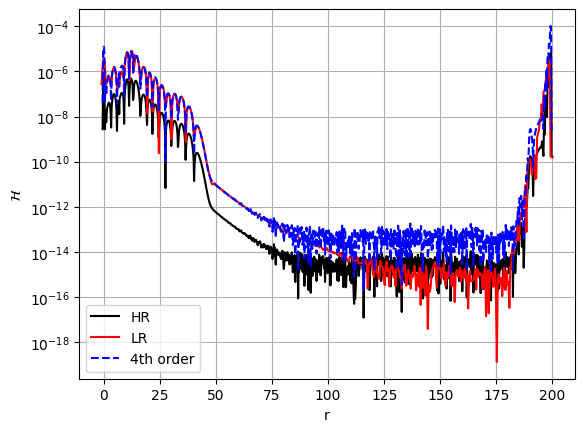

In [73]:
i = 20

plt.plot(r, abs(Ham[i,:]), color = 'k', label='HR')
plt.plot(r_LR, abs(Ham_LR[i,:]), color='r', label='LR')
plt.plot(r, abs(Ham[i,:]) * 2.0**4.0,':',label="4th order", linestyle = '--', color='b')
plt.legend(loc='best')
plt.xlabel('r')
plt.ylabel(r'$\mathcal{H}$')
plt.yscale('log')
#plt.xlim([175, 200])
plt.legend(loc='best')
plt.grid()

/var/folders/n_/m6f6pdtj2rz0xht07d4t_4nr0000gn/T/ipykernel_6299/1704762975.py:10: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string ":" (-> linestyle=':'). The keyword argument will take precedence.
  plt.plot(r, abs(Ham[i,:])/Ham_abs[i,:] * 2.0**4.0,':',label="4th order", linestyle = '--', color='b')


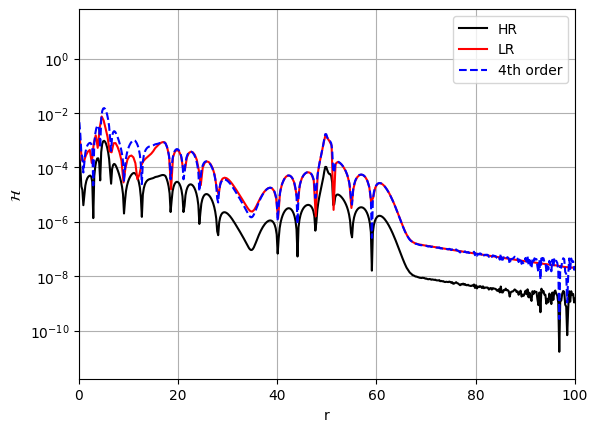

In [77]:
i = 50

Ham_abs[i, :] = np.maximum(Ham_abs[i, :], 1e-10)
Ham_abs_LR[i, :] = np.maximum(Ham_abs_LR[i, :], 1e-10)



plt.plot(r, abs(Ham[i,:])/Ham_abs[i,:], color = 'k', label='HR')
plt.plot(r_LR, abs(Ham_LR[i,:])/Ham_abs_LR[i,:], color='r', label='LR')
plt.plot(r, abs(Ham[i,:])/Ham_abs[i,:] * 2.0**4.0,':',label="4th order", linestyle = '--', color='b')
plt.legend(loc='best')
plt.xlabel('r')
plt.ylabel(r'$\mathcal{H}$')
plt.yscale('log')
plt.xlim([0, 100])
plt.legend(loc='best')
plt.grid()